# Train a model on focal recordings plus non focal
The previous approach of using all focal recordings for the positive class ended up producing a model with high precision - each of the detections it returned was of the target species - but it also missed half of the positive examples in the validation set. Changing the threshold didn't affect the precision and recall. 


# Model training log
This notebook has been run a few times, with different number of epochs and amounts of training data.

The results are all logged to weights and biases, and the corresponding models saved to file, but a note of the confusion matrix at threshold = 0.5 is saved here to provide continuity.

The model name is the same as the wandb run name which trained that model - it is possible to rename each run, but i've found it easier to stick with the generated ones.

### Example confusion matrix - this is from Run 193
![example confusion matrix](Images/run_1_confusion_matrix.png)

__Run 0: stoic-planet-192__

The present class in the trainig set was replaced entirely by the most focal examples as found by an earlier model, and then verified manually. 1000 samples per class, 10 epochs. <br>

[TN: 399,   FP:1]<br>
[FN: 196, TP:204]

__Run 1: clear-resonance-193__

500 of the present samples in the training set were replaced with focal present samples for a total of 1000 samples per class. This was a slight improvement in recall as shown by the increased true positives and reduced false negatives. 10 epochs.

[TN: 398,   FP:2]<br>
[FN: 128, TP:272]

__Run 2: celestial-star-196__. Same as run 1 but train for 20 epochs. There is a significant increase in recall, and a slight reduction in precision. 

[TN: 396,   FP:4]<br>
[FN: 54, TP:346]

__Run 3: gentle-cherry-198__  Use the balanced training set, and add 1000 extra focal samples, and 1000 extra samples from outside of the habitat of the target species for a Total 2000 of samples per class. 10 epochs. This model is fairly similar to the previous run. The best epoch was epoch 9 so it looks as though we can squeeze out some more performance here by training for longer. 

[TN: 399,   FP:1]<br>
[FN: 59, TP:341]


# Use the balanced training set, and add 1000 extra focal samples, and 1000 extra samples from outside of the habitat of the target species

The previous model was trained with 1000 focal. To make sure that any changes in performance aren't due to differences in training set size, we'll keep the same number of examples per class initially, and increase the sample size once we've decided on the best source of training sample. 

In [1]:
wandb_description = "Model trained on a mixed dataset of 1000 human labelled present, 1000 human labelled absent, 1000 focal present, and 1000 out of habitat absetn samples. 20 epochs."

In [2]:
# !pip install wandb
# ! pip install wandb --upgrade

In [3]:
# imports
import wandb
from pathlib import Path
import sys
import pandas as pd
BASE_PATH = Path.cwd().parent.parent
sys.path.append(str(BASE_PATH))
# import src.data
# import src.data.build
import opensoundscape as opso
from opensoundscape.preprocess.utils import show_tensor, show_tensor_grid
import numpy as np
model_save_path = BASE_PATH / 'models'
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import ipywidgets as widgets
from ipywidgets import interact
from src.utils import plot_locations, show_sample_from_df, show_samples_in_df, inspect_input_samples, get_binary_targets_scores, suppress_warnings_if_main_branch, clean_confidence_cats, add_missing_metadata_to_df, plot_metrics_across_thresholds, log_single_metric_to_wandb

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:18: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [ ]:
suppress_warnings_if_main_branch()

%load_ext autoreload
%autoreload 2

KeyboardInterrupt: 

In [ ]:
# If training on a Mac:
%env PYTORCH_ENABLE_MPS_FALLBACK 0

env: PYTORCH_ENABLE_MPS_FALLBACK=0


# Set some hyperparameters

In [ ]:
random_seed = 42
learning_rate = 0.001
epochs=20

# Load the data

In [ ]:
# load training and validation dataframes
data_path = Path.cwd().parent.parent / "data"
train_df = pd.read_pickle(data_path / "interim" / "train_set" / "balanced_train_set_verified.pkl")
valid_df = pd.read_pickle(data_path / "interim" / "valid_set" / "balanced_valid_set_verified.pkl")

# Re-label mis labelled samples and throw out ambiguous ones. 
train_df = clean_confidence_cats(train_df)

# Load more focal samples
train_focal = pd.read_pickle(data_path / "interim" / "train_set" / "train_focal.pkl")
train_focal = clean_confidence_cats(train_focal)

other_habitat_absent = pd.read_pickle(data_path / "interim" / "train_set" / "other_habitat_train.pkl")

In [ ]:
# Choose 1000 focal samples not already in training set. 
focal = train_focal.loc[~train_focal.index.isin(train_df.index)]
focal.confidence_cat.value_counts()

confidence_cat
4     980
3     780
33      2
6       1
Name: count, dtype: int64

In [ ]:
focal_800 = focal.loc[focal.confidence_cat == 4.0].sample(980, random_state = random_seed)
focal_200 = focal.loc[focal.confidence_cat == 3.0].sample(20, random_state = random_seed)
focal_1000 = pd.concat([focal_800, focal_200])

train_df = pd.concat([train_df, focal_1000, other_habitat_absent])
train_df.target_present.value_counts()

target_present
1.0    2000
0.0    1990
Name: count, dtype: int64

### Dataset (ds): PyTorch lingo for a pairing of the inputs with the targets.
The only feature needed for training alongside the input spectrogram is the present / absent label. So we can drop the remaining columns from the dataframe to make things neater. 

In [ ]:
# Shuffle the training set
train_ds = train_df[['target_present']].sample(frac=1, random_state=random_seed)
valid_ds = valid_df[['target_present']]
train_ds.head()

,,,target_present
file,start_time,end_time,
../../data/raw/recordings/OSFL/recording-207114.mp3,111.0,114.0,0.0
../../data/raw/recordings/OSFL/recording-816289.flac,90.0,93.0,1.0
../../data/raw/recordings/OSFL/recording-553600.flac,3.0,6.0,0.0
../../data/raw/recordings/OSFL/recording-566200.flac,4.5,7.5,1.0
../../data/raw/recordings/OSFL/recording-292675.mp3,43.5,46.5,0.0


# Define a model architecture to train. 

In [ ]:
# Create a CNN object designed to recognize 3-second samples
from opensoundscape import CNN

# Use resnet18 (faster) or resnet34 architecture
architecture = 'resnet34'

# Can use this code to get your classes, if needed
class_list = list(train_ds.columns)

model = CNN(
    architecture = architecture,
    classes = class_list,
    sample_duration=3,
    
)

# Single target means that a clip can have only one positive label at a time. For multi class problems this could be set to true or false depending on whether there are multiple simultaneous labels. For binary problem it can be set to false to enable sigmoid activation at the final layer. 
model.single_target = False
model.optimizer_params['lr'] = learning_rate

model.classes

['target_present']

Look at some samples from the database.

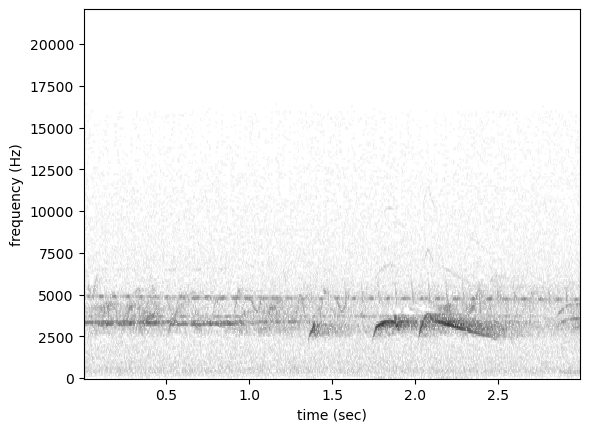

In [ ]:
# ctrl + enter to cycle through samples from the dataset. Choose present or absent. 
show_sample_from_df(train_ds, label='present')

In [ ]:
# Make sure you're using the GPU - it should say 'cuda' if you are on a pc and 'mps' on a mac. 
print(f'model.device is: {model.device}')

model.device is: mps


# Weights & Biases initialization
Weights and biases is used to track the progress during model training, and to compare different models with one-another. 

In [ ]:
# Passing in the name of the current notebook here.
%set_env WANDB_NOTEBOOK_NAME={Path.cwd()}/10-train-a-model-using-mixture-of-focal-and-non-focal.ipynb

wandb.login()

wandb_session = wandb.init(

    project='OSFL',
    notes=wandb_description,
    config={
    "epochs":epochs,
    "random_seed": random_seed}
)
wandb.config.learning_rate = learning_rate

wandb: WARNING Calling wandb.login() after wandb.init() has no effect.


env: WANDB_NOTEBOOK_NAME=/Users/mikeg/code/machine_learning/osfl_cnn_recognizer/notebooks/model_development_walkthrough/10-train-a-model-using-mixture-of-focal-and-non-focal.ipynb


/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/wandb/sdk/lib/ipython.py:89: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display


/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/wandb/sdk/lib/ipython.py:89: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display


/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/wandb/sdk/lib/ipython.py:77: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import HTML, display  # type: ignore


# Show training examples at model input
The image augmentations are turned off, but can be turned on again by setting bypass_augmentations to False. 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

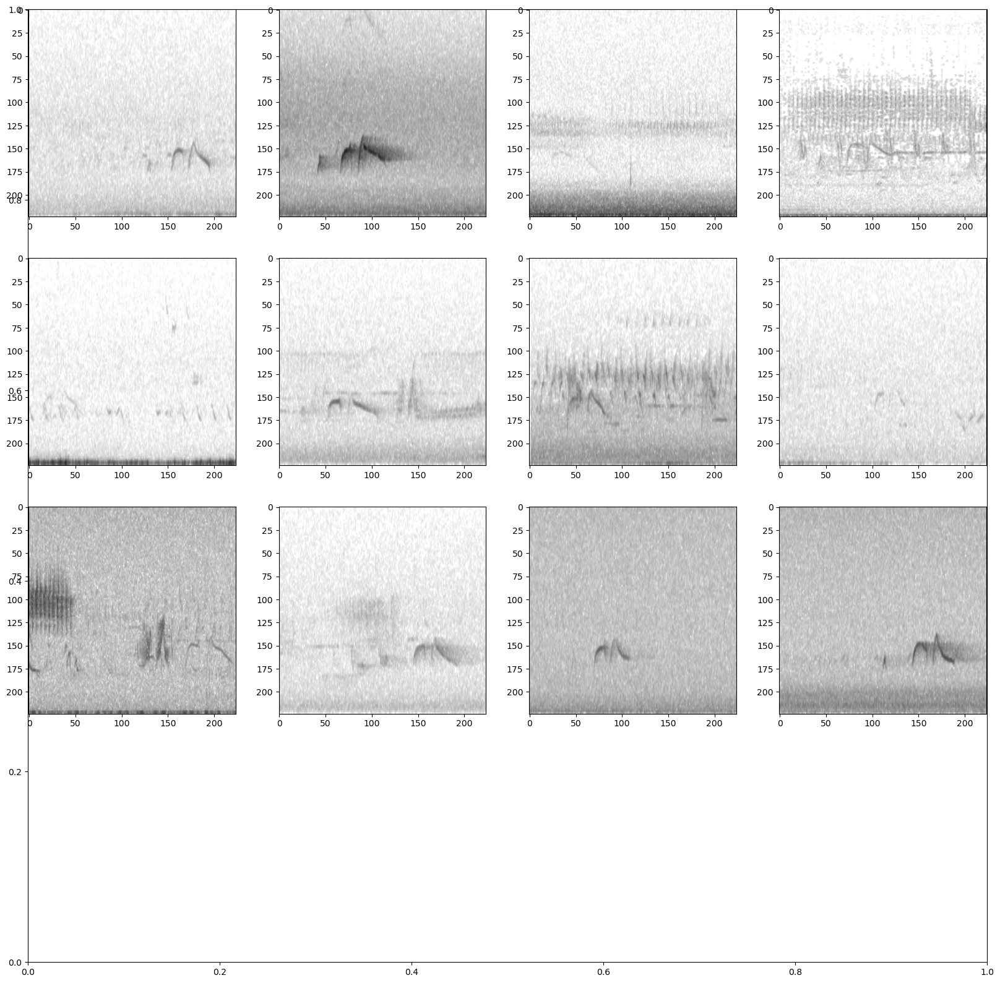

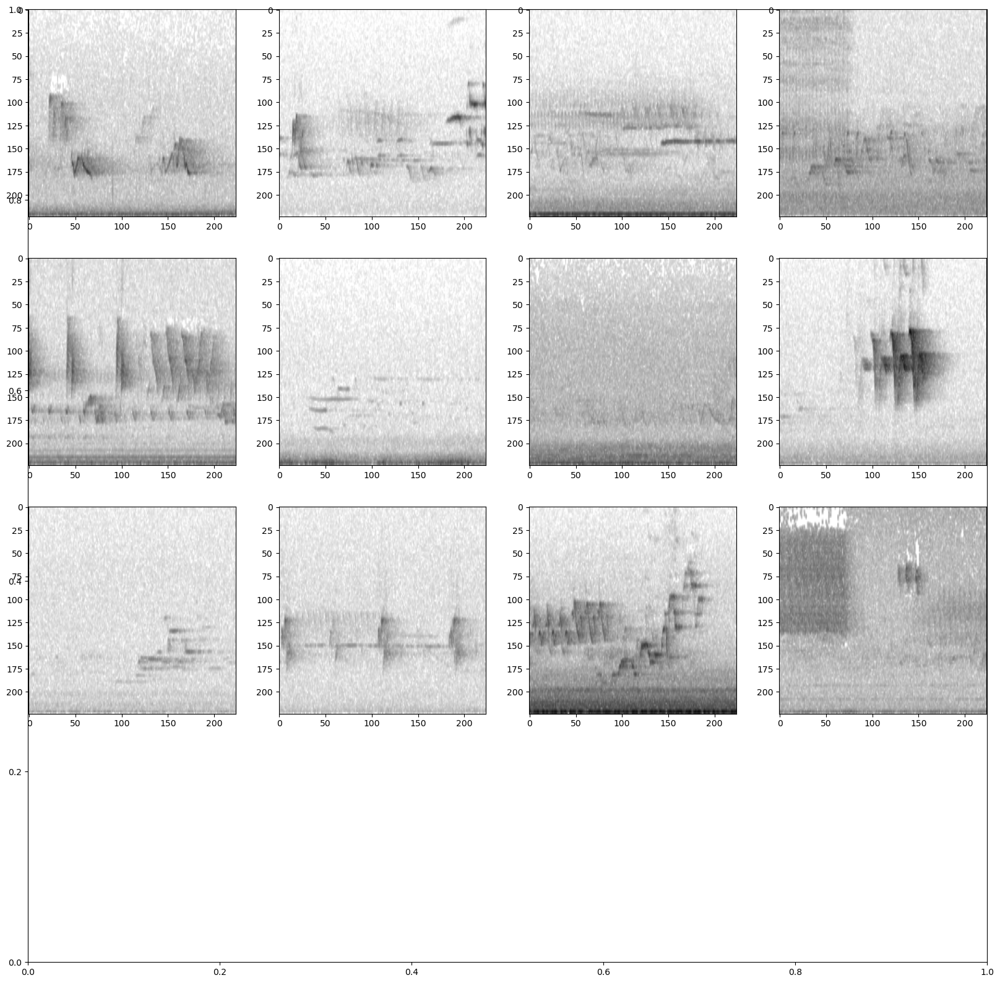

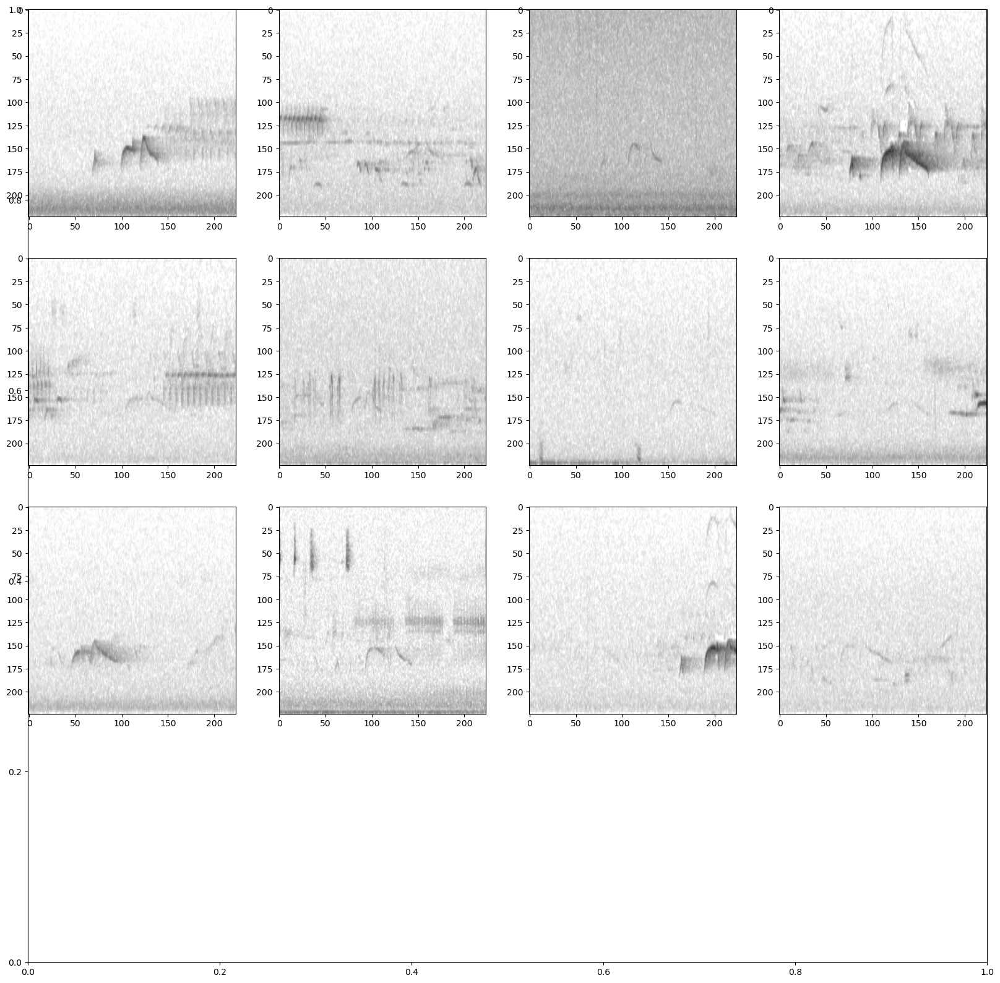

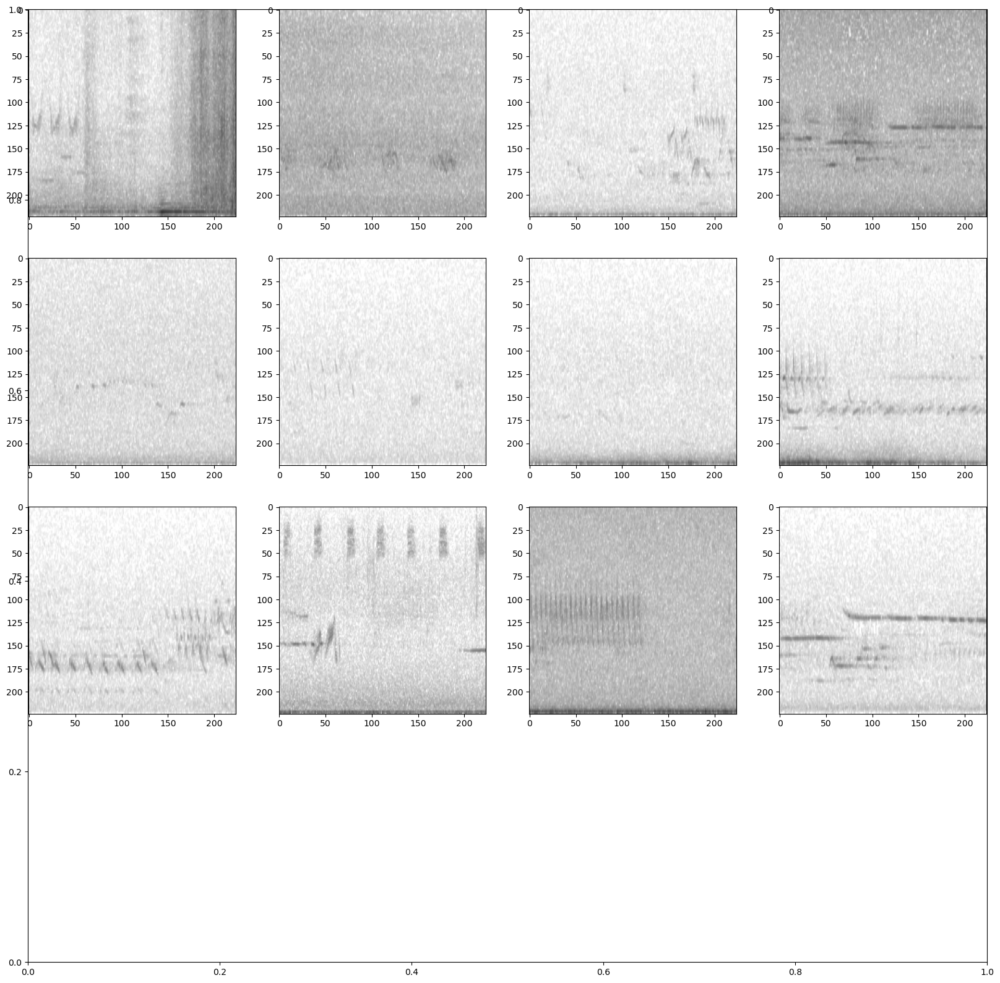

In [ ]:
inspect_input_samples(train_ds, valid_ds, model, bypass_augmentations=True)

# Train the model

In [ ]:
# Train the model
model.train(
    train_ds,
    valid_ds,
    epochs = epochs,
    batch_size = 64,
    num_workers = 4, # parallelized cpu tasks for preprocessing. Reduce if dataloader quits unexpectedly. 
    log_interval = 100,
    save_interval = 10,
    save_path=model_save_path,
    invalid_samples_log="./invalid_samples.log",
    wandb_session = wandb_session,
    )


Training Epoch 0


  0%|          | 0/63 [00:00<?, ?it/s]

Epoch: 0 [batch 0/63, 0.00%] 
	DistLoss: 0.676
Metrics:
Metrics:
	MAP: 0.623

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.655

Training Epoch 1


  0%|          | 0/63 [00:00<?, ?it/s]

Epoch: 1 [batch 0/63, 0.00%] 
	DistLoss: 0.695
Metrics:
Metrics:
	MAP: 0.825

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.872

Training Epoch 2


  0%|          | 0/63 [00:00<?, ?it/s]

Epoch: 2 [batch 0/63, 0.00%] 
	DistLoss: 0.450
Metrics:
Metrics:
	MAP: 0.894

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.943

Training Epoch 3


  0%|          | 0/63 [00:00<?, ?it/s]

Epoch: 3 [batch 0/63, 0.00%] 
	DistLoss: 0.425
Metrics:
Metrics:
	MAP: 0.914

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.969

Training Epoch 4


  0%|          | 0/63 [00:00<?, ?it/s]

Epoch: 4 [batch 0/63, 0.00%] 
	DistLoss: 0.515
Metrics:
Metrics:
	MAP: 0.934

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.980

Training Epoch 5


  0%|          | 0/63 [00:00<?, ?it/s]

Epoch: 5 [batch 0/63, 0.00%] 
	DistLoss: 0.193
Metrics:
Metrics:
	MAP: 0.944

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.979

Training Epoch 6


  0%|          | 0/63 [00:00<?, ?it/s]

Epoch: 6 [batch 0/63, 0.00%] 
	DistLoss: 0.296
Metrics:
Metrics:
	MAP: 0.949

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.979

Training Epoch 7


  0%|          | 0/63 [00:00<?, ?it/s]

Epoch: 7 [batch 0/63, 0.00%] 
	DistLoss: 0.345
Metrics:
Metrics:
	MAP: 0.957

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.982

Training Epoch 8


  0%|          | 0/63 [00:00<?, ?it/s]

Epoch: 8 [batch 0/63, 0.00%] 
	DistLoss: 0.273
Metrics:
Metrics:
	MAP: 0.960

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.988

Training Epoch 9


  0%|          | 0/63 [00:00<?, ?it/s]

Epoch: 9 [batch 0/63, 0.00%] 
	DistLoss: 0.181
Metrics:
Metrics:
	MAP: 0.969

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.989

Best Model Appears at Epoch 9 with Validation score 0.989.


# If you get an error saying sample is shorter than expected duration:
If this error is causing training to stall one workaround is to add the following three lines of code to the opensoundscape/audio.py just after the code that prints the error message:



``` python3
error_log = (f"Path: {path}, start_time: {offset} sec, end_time {offset + duration} sec.")
with open ("short_samples.log", "a") as log:
    log.write(f"{error_log}\n")
```

The short samples causing the warning can be removed using
``` python3
remove_short_clips(train_ds)
```

# Plot confusion matrix

In [ ]:
wandb_session.name

'gentle-cherry-198'

In [ ]:
predictions = model.predict(valid_ds, batch_size=64, num_workers=4)

# replace the predicitons made with the previous model with the new predictions
valid_df['predicted'] = predictions

  0%|          | 0/13 [00:00<?, ?it/s]

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/ipywidgets/widgets/interaction.py:43: DeprecationWarning: `ipykernel.pylab.backend_inline` is deprecated, directly use `matplotlib_inline.backend_inline`
  from ipykernel.pylab.backend_inline import flush_figures


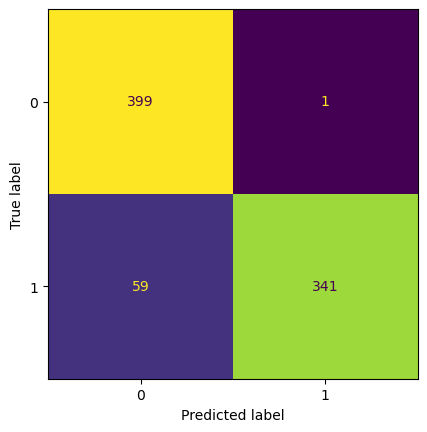

interactive(children=(FloatSlider(value=0.5, description='threshold', max=1.0, step=0.01), Output()), _dom_cla…

<function __main__.plot_confusion_matrix(threshold=0.5)>

In [ ]:
def plot_confusion_matrix(threshold=0.5):
    preds, targets, scores = get_binary_targets_scores(valid_df, predictions, threshold)
    # plot confusion matrix
    cm = confusion_matrix(targets, preds)
    _ = ConfusionMatrixDisplay(cm).plot(colorbar=False)
    return cm
cm = plot_confusion_matrix(threshold=0.5)
interact(plot_confusion_matrix, threshold=(0.0, 1.0, 0.01))

# Plot metrics across thresholds

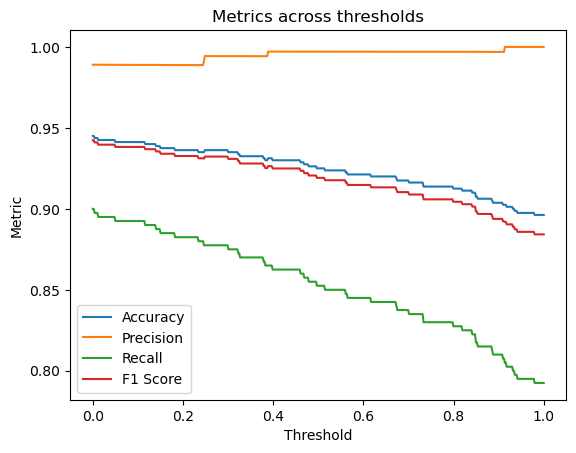

In [ ]:
plot_data, legend = plot_metrics_across_thresholds(valid_df, 'predicted', 'target_present')
thresholds, accuracies, precisions, recalls, f1s = zip(*list(plot_data))

In [ ]:
log_single_metric_to_wandb(accuracies, thresholds, "accuracy")
log_single_metric_to_wandb(precisions, thresholds, "precision")
log_single_metric_to_wandb(recalls, thresholds,  "recall")
log_single_metric_to_wandb(f1s, thresholds, "f1")

# View the errors
The model made some errors - let's take a look at these and see what kinds of samples lead to these errors

In [ ]:
# Collect the errors
false_positives = valid_df.loc[valid_df.predicted >= 0.5].loc[valid_df['target_present'] == 0]
false_negatives = valid_df.loc[valid_df.predicted < 0.5].loc[valid_df['target_present'] == 1]

## Show the false positives

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


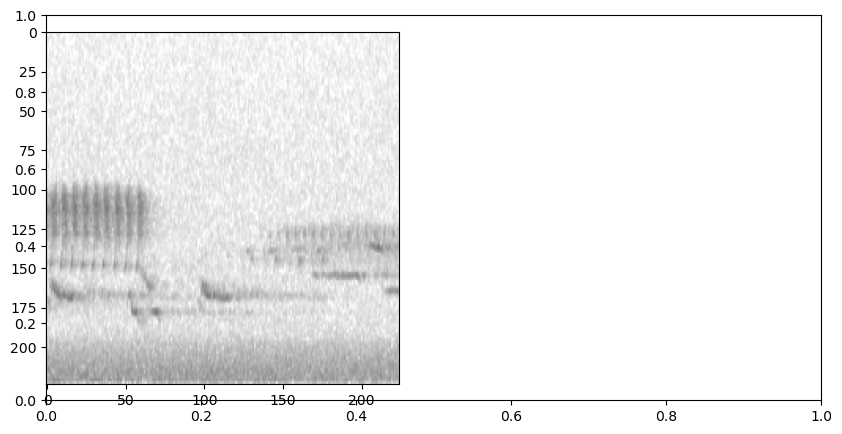

In [ ]:
show_samples_in_df(false_positives, model)

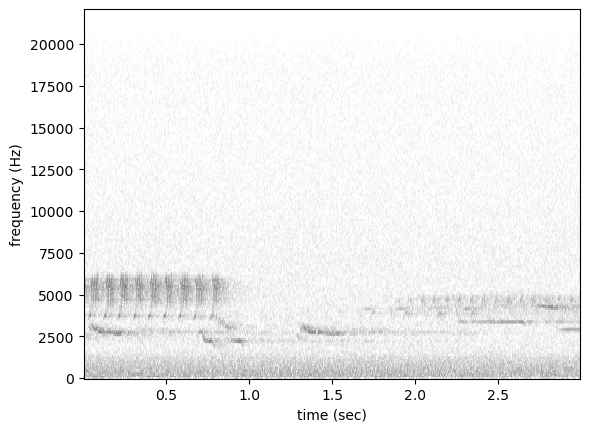

In [ ]:
show_sample_from_df(false_positives, label='absent')

## Show the false negatives

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


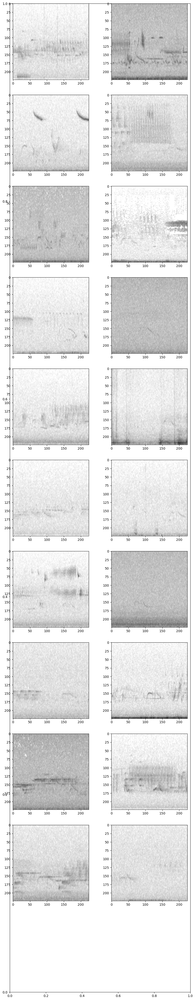

In [ ]:
show_samples_in_df(false_negatives.sample(20), model)

This experiment shows that by only including focal samples in training, we can train a model which has high precision but poor recall. 

## Weights & Biases makes a memorable name for each model training run.

In [ ]:
wandb.run.name

'gentle-cherry-198'

# Save the model under this name

In [ ]:
model.save(model_save_path / f"{wandb.run.name}.model")

# End the weights and biases session 

In [ ]:
wandb.finish()

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/wandb/sdk/lib/ipython.py:89: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display


/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/wandb/sdk/lib/ipython.py:77: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import HTML, display  # type: ignore


epoch,▁▂▃▃▄▅▆▆▇█
loss,█▆▄▄▃▂▂▂▂▁
epoch,9
loss,0.23817
